# 🎯 Production Tap Detection Pipeline

This notebook runs a complete pipeline for detecting and classifying hammer taps from a test video containing good and bad surface taps. Each step is modular and output is displayed inline.

In [1]:
# Auto-reload extension setup
%load_ext autoreload
%autoreload 2

import sys
import os

# Add the 'src' directory to the Python path
sys.path.append(os.path.abspath('../../src'))

from IPython.display import display, Video, Image, Audio
import os
from core import tap_detection as td
import librosa.display
from moviepy.editor import VideoFileClip

2025-07-31 01:34:06.559552: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


## 📁 Step 1: Upload and Preview the Video

In [2]:
# Provide the video path manually or through an upload widget

clip = VideoFileClip("../../resources/material/test-data/test-material.mov")
clip.write_videofile("../../resources/material/test-data/test-material.mp4", codec="libx264")



video_path = "../../resources/material/test-data/test-material.mp4"
display(Video(video_path, embed=True, width=600))

Moviepy - Building video ../../resources/material/test-data/test-material.mp4.
MoviePy - Writing audio in test-materialTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ../../resources/material/test-data/test-material.mp4



Moviepy - Done !
Moviepy - video ready ../../resources/material/test-data/test-material.mp4


## 🔊 Step 2: Extract Audio from Video

In [3]:
audio_path = td.extract_audio_from_video(video_path, output_wav="../../resources/material/test-data/test-material.wav")
display(Audio(audio_path))
print(audio_path)

[INFO] Extracting audio from: ../../resources/material/test-data/test-material.mp4
MoviePy - Writing audio in ../../resources/material/test-data/test-material.wav


MoviePy - Done.
[SUCCESS] Audio saved to: ../../resources/material/test-data/test-material.wav


../../resources/material/test-data/test-material.wav


## 🔎 Step 3: Detect Tap Timestamps

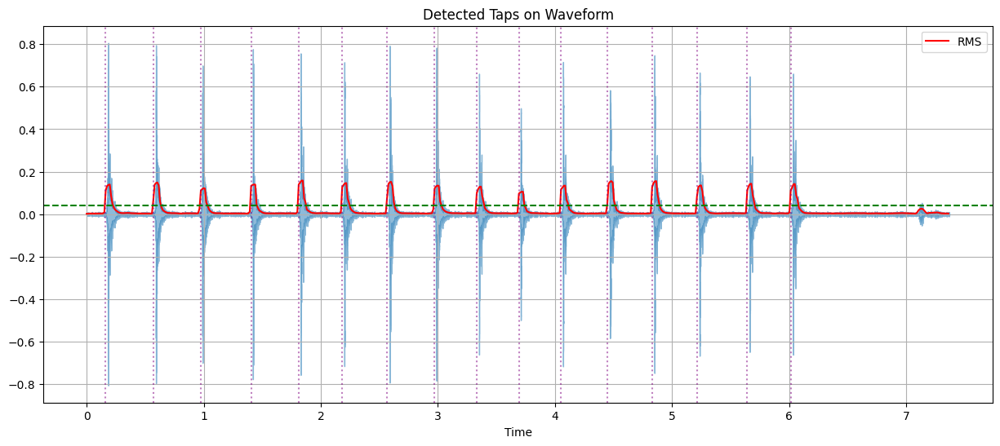

In [4]:
# Configuration
THRESHOLD = 0.04

# Define paths
output_dir = f'../../resources/material/test-data/test-material-taps'

# Load audio
y, sr = librosa.load(audio_path, sr=None)

# Detect taps
tap_times, tap_frames, rms = td.detect_taps(y, sr, threshold=THRESHOLD)

# Plot interactively
td.plot_waveform_with_taps(y, sr, tap_times, rms, THRESHOLD)

# Save if satisfied
SAVE = True
if SAVE:
    td.extract_and_save_taps(y, sr, tap_times, output_dir, material_type="test")


## 🎞️ Step 4: Extract Tap Frames from Video

Extracting frames at tap times...
Video path: ../../resources/material/test-data/test-material.mp4
Tap times (s): [0.16253968 0.56888889 0.9752381  1.40480726 1.81115646 2.18267574
 2.56580499 2.9721542  3.33206349 3.69197279 4.05188209 4.44662132
 4.82975057 5.21287982 5.64244898 6.01396825]
[INFO] Video FPS: 60.00
[INFO] Using dynamic frame offset: 0.0833 seconds
[✓] Saved frame 14 as ../../resources/material/test-data/test-material-taps_frames/tap_frame_1.jpg
[✓] Saved frame 39 as ../../resources/material/test-data/test-material-taps_frames/tap_frame_2.jpg
[✓] Saved frame 63 as ../../resources/material/test-data/test-material-taps_frames/tap_frame_3.jpg
[✓] Saved frame 89 as ../../resources/material/test-data/test-material-taps_frames/tap_frame_4.jpg
[✓] Saved frame 113 as ../../resources/material/test-data/test-material-taps_frames/tap_frame_5.jpg
[✓] Saved frame 135 as ../../resources/material/test-data/test-material-taps_frames/tap_frame_6.jpg
[✓] Saved frame 158 as ../../resourc

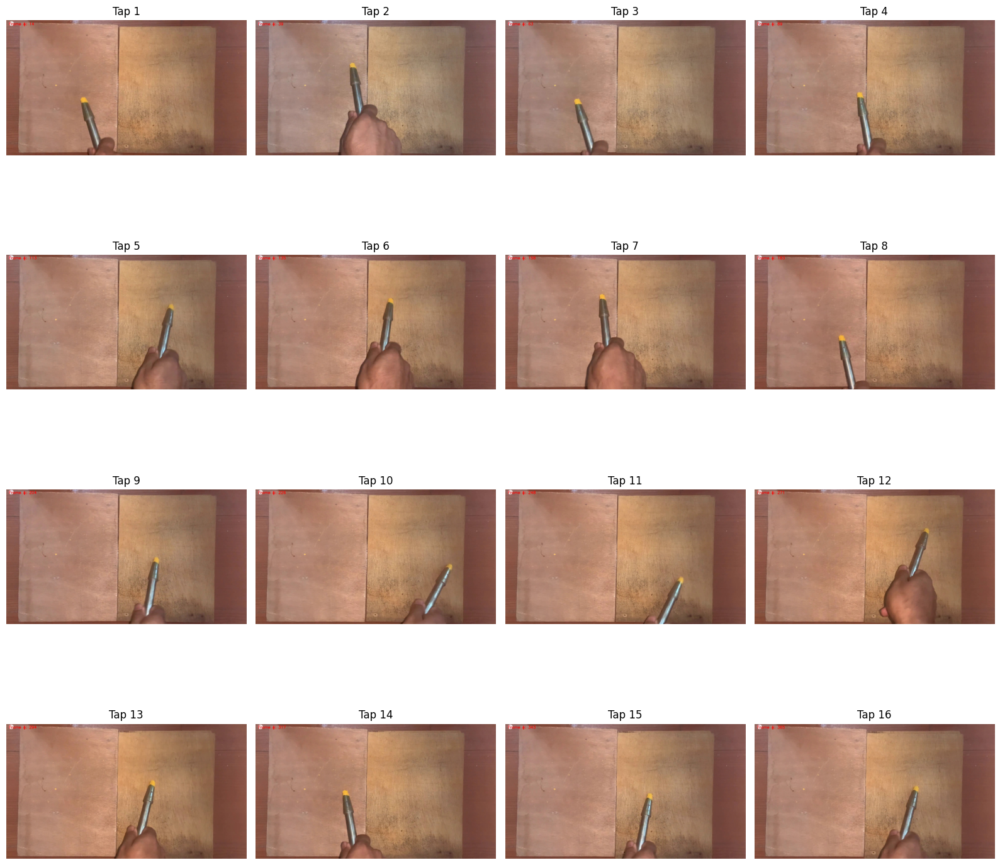

In [5]:
from IPython.display import Image, display
import os

# Define paths
tap_frames_output_dir = f'../../resources/material/test-data/test-material-taps_frames'

# Extract frames at tap times
print("Extracting frames at tap times...")
print("Video path:", video_path)
print("Tap times (s):", tap_times)

frame_paths = td.extract_frames(video_path, tap_times, tap_frames_output_dir)

# Display extracted frames
print(f"\nDisplaying {len(frame_paths)} extracted tap frames:")
td.display_images_in_grid(frame_paths, images_per_row=4, scale=4)


## 📌 Step 5: Annotate Hammer Tips

[✓] Annotated hammer tip at (627, 646) in tap_frame_1.jpg
[✓] Annotated hammer tip at (782, 365) in tap_frame_2.jpg
[✓] Annotated hammer tip at (580, 654) in tap_frame_3.jpg
[✓] Annotated hammer tip at (845, 607) in tap_frame_4.jpg
[✓] Annotated hammer tip at (1318, 422) in tap_frame_5.jpg
[✓] Annotated hammer tip at (1085, 394) in tap_frame_6.jpg
[✓] Annotated hammer tip at (777, 342) in tap_frame_7.jpg
[✓] Annotated hammer tip at (701, 689) in tap_frame_8.jpg
[✓] Annotated hammer tip at (1208, 570) in tap_frame_9.jpg
[✓] Annotated hammer tip at (1556, 628) in tap_frame_10.jpg
[✓] Annotated hammer tip at (1405, 737) in tap_frame_11.jpg
[✓] Annotated hammer tip at (1379, 337) in tap_frame_12.jpg
[✓] Annotated hammer tip at (1175, 489) in tap_frame_13.jpg
[✓] Annotated hammer tip at (717, 548) in tap_frame_14.jpg
[✓] Annotated hammer tip at (1156, 588) in tap_frame_15.jpg
[✓] Annotated hammer tip at (1292, 525) in tap_frame_16.jpg

Displaying 16 extracted tap frames:


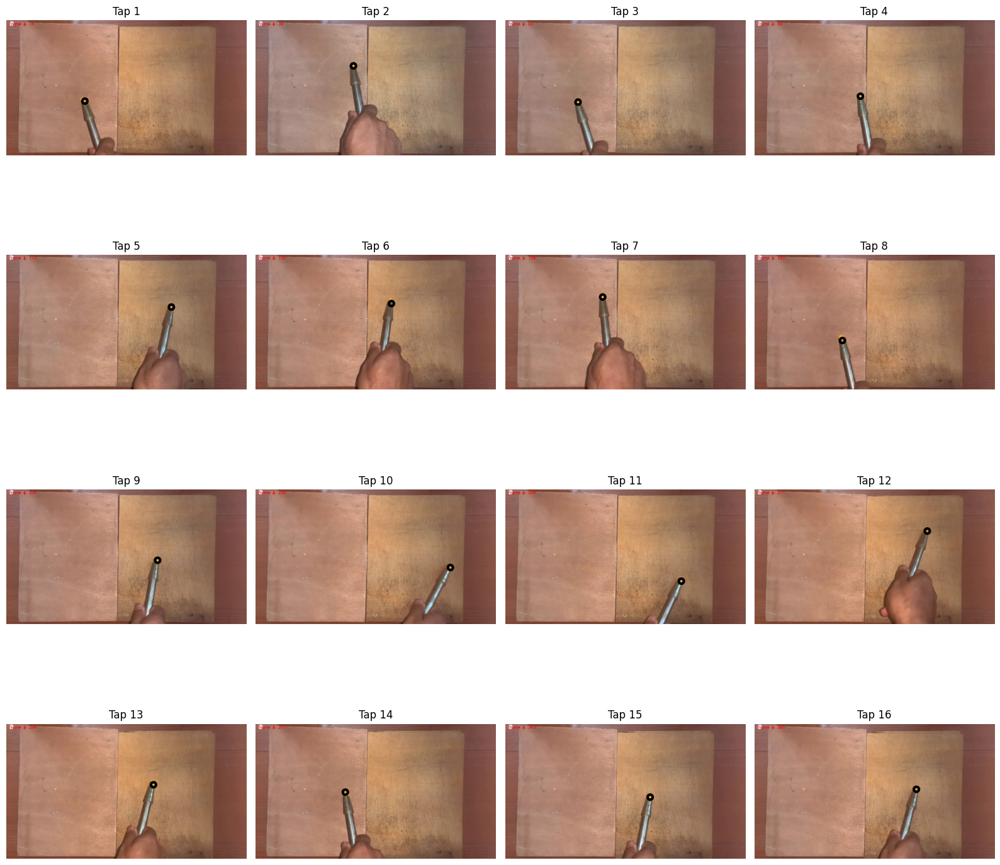

In [6]:
# Define paths
annotate_tap_location_output_dir = f'../../resources/material/test-data/test-material-annotate-hammer-location'

annotated_paths, tap_coords = td.annotate_hammer_tips(
    frame_paths,
    output_dir=annotate_tap_location_output_dir
)

# Display extracted frames
print(f"\nDisplaying {len(annotated_paths)} extracted tap frames:")
td.display_images_in_grid(annotated_paths, images_per_row=4, scale=4)

# Optional: Save coordinates to CSV
import pandas as pd
df = pd.DataFrame({"image": annotated_paths, "tap_x": [pt[0] if pt else None for pt in tap_coords], "tap_y": [pt[1] if pt else None for pt in tap_coords]})
df.to_csv("../../resources/csv/tap_coordinates.csv", index=False)

## 🎼 Step 6: Convert Taps to Mel NPY

In [7]:
npy_paths = td.convert_taps_to_npy(
    audio_dir="../../resources/material/test-data/test-material-taps",
    tap_times=tap_times,
    output_dir="../../resources/material/test-data/test-material-taps-npy"
)


✅ Saved NPY: ../../resources/material/test-data/test-material-taps-npy/test_tap_1.npy | Shape: (4096,)
✅ Saved NPY: ../../resources/material/test-data/test-material-taps-npy/test_tap_2.npy | Shape: (4096,)
✅ Saved NPY: ../../resources/material/test-data/test-material-taps-npy/test_tap_3.npy | Shape: (4096,)
✅ Saved NPY: ../../resources/material/test-data/test-material-taps-npy/test_tap_4.npy | Shape: (4096,)
✅ Saved NPY: ../../resources/material/test-data/test-material-taps-npy/test_tap_5.npy | Shape: (4096,)
✅ Saved NPY: ../../resources/material/test-data/test-material-taps-npy/test_tap_6.npy | Shape: (4096,)
✅ Saved NPY: ../../resources/material/test-data/test-material-taps-npy/test_tap_7.npy | Shape: (4096,)
✅ Saved NPY: ../../resources/material/test-data/test-material-taps-npy/test_tap_8.npy | Shape: (4096,)
✅ Saved NPY: ../../resources/material/test-data/test-material-taps-npy/test_tap_9.npy | Shape: (4096,)
✅ Saved NPY: ../../resources/material/test-data/test-material-taps-npy/te

## ✅ Step 7: Classify Tap Quality

In [8]:
import os
import glob

def build_npy_paths(base_dir):
    """
    Recursively finds all .npy files in base_dir.
    """
    npy_paths = glob.glob(os.path.join(base_dir, '**', '*.npy'), recursive=True)
    npy_paths = sorted(npy_paths)
    print(f"🔍 Found {len(npy_paths)} NPY files in: {base_dir}")
    return npy_paths


def validate_npy_shapes(npy_paths, expected_shape=(128 * 32,)):
    """
    Checks if all .npy files can be loaded and match the expected shape.
    """
    for path in npy_paths:
        try:
            data = np.load(path)
            if data.shape != expected_shape:
                print(f"⚠️  Shape mismatch in {os.path.basename(path)}: {data.shape}")
            else:
                print(f"✅ {os.path.basename(path)} OK — shape: {data.shape}")
        except Exception as e:
            print(f"❌ Failed to load {path}: {e}")

npy_dir = "../../resources/material/test-data/test-material-taps-npy"
#npy_paths = build_npy_paths(npy_dir)
model_path = "../../model/standalone_non-IID_model.h5"
predictions = td.classify_tap_quality(npy_paths, model_path)
print(f"predictions : {predictions}")

📦 Loading model from: ../../model/standalone_non-IID_model.h5
✅ Model successfully loaded.

🔍 Performing predictions on NPY files:
🟢 test_tap_1.npy → Probability: 1.0000, Predicted: good
🟢 test_tap_2.npy → Probability: 0.9694, Predicted: good
🟢 test_tap_3.npy → Probability: 1.0000, Predicted: good
🟢 test_tap_4.npy → Probability: 0.9995, Predicted: good
🔴 test_tap_5.npy → Probability: 0.0023, Predicted: bad
🔴 test_tap_6.npy → Probability: 0.0199, Predicted: bad
🟢 test_tap_7.npy → Probability: 0.9981, Predicted: good
🟢 test_tap_8.npy → Probability: 1.0000, Predicted: good
🔴 test_tap_9.npy → Probability: 0.0009, Predicted: bad
🔴 test_tap_10.npy → Probability: 0.0017, Predicted: bad
🔴 test_tap_11.npy → Probability: 0.1224, Predicted: bad
🔴 test_tap_12.npy → Probability: 0.0008, Predicted: bad
🔴 test_tap_13.npy → Probability: 0.0014, Predicted: bad
🟢 test_tap_14.npy → Probability: 0.9772, Predicted: good
🔴 test_tap_15.npy → Probability: 0.0003, Predicted: bad
🔴 test_tap_16.npy → Probability

## 🖼️ Step 8: Annotate Final Frame

✅ Last frame saved to: ../../resources/material/test-data/test-result/final_result.jpg


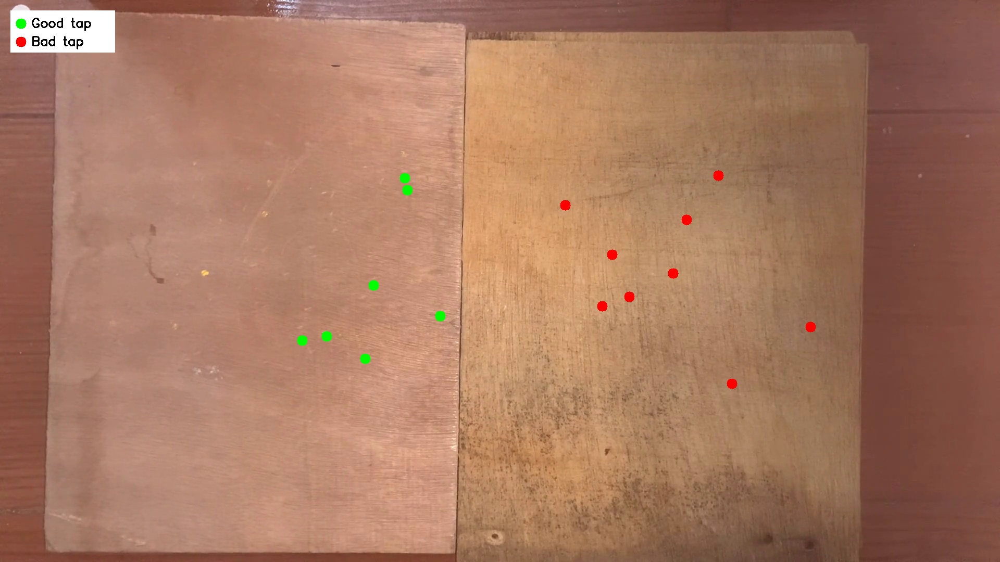

In [33]:
from PIL import Image as PILImage
from IPython.display import Image, display

# Step 1: Extract the last frame from the video
video_path = "../../resources/material/test-data/test-material.mp4"
last_frame_output_path = "../../resources/material/test-data/test-result/final_result.jpg"
last_frame_path = td.extract_last_frame(video_path, last_frame_output_path)

# Step 2: Load annotations and predictions
annotations = td.load_annotations("../../resources/csv/tap_coordinates.csv")  # must be list of dicts

# # Step 3: Visualize taps on the last frame (filled circles, no text, legend in corner)
td.visualize_taps_on_frame(
    last_frame_path,
    annotations,
    predictions,
    output_path="../../resources/material/test-data/test-result/final_result.jpg"
)
